In [0]:
pip install pycaret

     |████████████████████████████████| 194kB 3.4MB/s 
     |████████████████████████████████| 7.0MB 10.6MB/s 
     |████████████████████████████████| 63.9MB 58kB/s 
     |████████████████████████████████| 389kB 44.8MB/s 
     |████████████████████████████████| 61kB 7.4MB/s 
     |████████████████████████████████| 81kB 9.1MB/s 
     |████████████████████████████████| 3.0MB 42.5MB/s 
     |████████████████████████████████| 102kB 9.3MB/s 
     |████████████████████████████████| 1.2MB 42.7MB/s 
     |████████████████████████████████| 133kB 45.4MB/s 
     |████████████████████████████████| 266kB 38.4MB/s 
     |████████████████████████████████| 1.6MB 43.0MB/s 
     |████████████████████████████████| 235kB 42.3MB/s 
     |████████████████████████████████| 71kB 8.3MB/s 
     |████████████████████████████████| 51kB 6.2MB/s 
     |████████████████████████████████| 6.2MB 40.0MB/s 
     |████████████████████████████████| 2.1MB 44.1MB/s 
     |████████████████████████████████| 614kB 42.6MB/s 
   

In [0]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode activated.


In [0]:
import pandas as pd
import tensorflow as tf
from sklearn.linear_model import LinearRegression


In [0]:
from google.colab import drive
drive.mount('/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /drive


In [74]:
singlefam_data = pd.read_csv('/drive/My Drive/Project_3/ca_singlefam_listing.csv')



In [75]:
len(singlefam_data)

1938

In [76]:
singlefam_data.head()

,property_id,prop_type,price,baths_half,baths_full,beds,city,postal_code,state_code,county,building_size,lot_size
0,M1420126120,single_family,499700,0.0,3.0,4,Dixon,95620,CA,Solano,2169.0,4783.0
1,M2415397004,single_family,340000,0.0,2.0,3,Sacramento,95826,CA,Sacramento,1270.0,5920.0
2,M1186346624,single_family,375900,0.0,3.0,4,Citrus Heights,95610,CA,Sacramento,1736.0,6098.0
3,M2897618299,single_family,395000,0.0,2.0,3,Sacramento,95826,CA,Sacramento,1516.0,6739.0
4,M2738139661,single_family,1275000,0.0,3.0,3,Sacramento,95831,CA,Sacramento,3375.0,24202.0


In [77]:
singlefam_data.dropna(inplace=True)

In [78]:
singlefam_data.drop_duplicates(inplace=True)

In [40]:
 from pandas_profiling import ProfileReport

profile = ProfileReport(singlefam_data, title='Pandas Profiling Report')

In [0]:
profile

In [79]:
dataset = singlefam_data.drop(columns=['property_id','prop_type','state_code','baths_half','lot_size'])
dataset.shape

(1921, 7)

In [44]:
dataset.head()

,price,baths_full,beds,city,postal_code,county,building_size
0,499700,3.0,4,Dixon,95620,Solano,2169.0
1,340000,2.0,3,Sacramento,95826,Sacramento,1270.0
2,375900,3.0,4,Citrus Heights,95610,Sacramento,1736.0
3,395000,2.0,3,Sacramento,95826,Sacramento,1516.0
4,1275000,3.0,3,Sacramento,95831,Sacramento,3375.0


In [80]:
dataset.reset_index(inplace=True,drop=True)

In [81]:
dataset.shape

(1921, 7)

In [82]:
data = dataset.sample(frac=0.9, random_state=76).reset_index(drop=True)
data_unseen = dataset.drop(data.index).reset_index(drop=True)

print(f'Data for modeling: {data.shape}')
print(f'Unseen data for predictions: {data_unseen.shape}')

Data for modeling: (1729, 7)
Unseen data for predictions: (192, 7)


In [49]:
from pycaret.regression import *
setup = setup(data = data, target = 'price', normalize =True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,3864
1,Transform Target,False
2,Transform Target Method,None
3,Original Data,"(1741, 7)"
4,Missing Values,False
5,Numeric Features,3
6,Categorical Features,3
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [83]:
new_dataset = dataset.drop(dataset[dataset['price'] > 3000000].index)

new_dataset.reset_index(inplace=True, drop=True)
new_dataset.shape

(1780, 7)

In [84]:
profile = ProfileReport(new_dataset, title='Pandas Profiling Report (less outliers')

In [85]:
profile

In [127]:
new_data = new_dataset.sample(frac=0.9, random_state=76).reset_index(drop=True)
newdata_unseen = new_dataset.drop(data.index).reset_index(drop=True)

print(f'Data for modeling: {new_data.shape}')
print(f'Unseen data for predictions: {newdata_unseen.shape}')


Data for modeling: (1602, 7)
Unseen data for predictions: (51, 7)


In [87]:
from pycaret.regression import *
setup = setup(data = new_data, target = 'price', normalize =True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,6414
1,Transform Target,False
2,Transform Target Method,None
3,Original Data,"(1602, 7)"
4,Missing Values,False
5,Numeric Features,3
6,Categorical Features,3
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [88]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,192711.527800,86800028710.715607,293244.691300,0.771800,0.278400,0.228800
1,Random Forest,191898.990400,92754031511.356094,302359.929100,0.756200,0.276300,0.219400
2,Light Gradient Boosting Machine,207208.104900,99742325142.032104,313413.629700,0.738300,0.307800,0.248600
3,Gradient Boosting Regressor,212759.445000,100882943459.545807,316356.273600,0.735000,0.302400,0.259500
4,Extreme Gradient Boosting,213190.162100,101119158494.629395,316316.003200,0.734900,0.304900,0.262100
5,Ridge Regression,222410.727800,103445444431.498199,320510.592300,0.727300,0.479800,0.284100
6,Extra Trees Regressor,202155.763800,103222591595.529007,319941.707000,0.726200,0.284400,0.226400
7,Lasso Least Angle Regression,223443.908600,106707859739.942795,325520.308200,0.719500,0.462400,0.281100
8,TheilSen Regressor,233349.745600,113789030593.425705,336168.104100,0.701400,0.521200,0.296500
9,Lasso Regression,233345.187700,115540120571.639999,339195.686700,0.696000,0.503100,0.301400


In [125]:
cb = create_model('catboost')


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,178214.0451,7.052733e+10,265569.8241,0.6562,0.2865,0.2405
1,177658.7484,6.099007e+10,246961.6869,0.6774,0.2766,0.2295
2,160869.0009,5.668571e+10,238087.6093,0.7320,0.2741,0.2216
3,138792.1666,4.409447e+10,209986.8354,0.8047,0.2724,0.2182
4,183433.2551,7.001971e+10,264612.3705,0.6776,0.2896,0.2389
5,188548.7448,7.219196e+10,268685.6158,0.7135,0.2910,0.2479
6,139619.9373,3.809736e+10,195185.4494,0.8188,0.2251,0.1845
7,145936.1569,4.403392e+10,209842.6002,0.7968,0.2493,0.2041
8,149654.3345,4.375365e+10,209173.7306,0.7772,0.2725,0.2122
9,168771.1527,5.942355e+10,243769.4559,0.6929,0.2732,0.2257


In [139]:
# finalize a model
cb_final = finalize_model(cb)

# generate predictions on unseen data
cb_predictions = predict_model(cb_final, data = newdata_unseen)
cb_predictions.shape

(51, 8)

In [138]:
cb_predictions.head()

,price,baths_full,beds,city,postal_code,county,building_size,Output
0,348950,2.0,3,Fresno,93727,Fresno,2223.0,350850.3170
1,361900,2.0,3,Madera,93636,Madera,2876.0,477221.7658
2,298000,2.0,3,Fresno,93727,Fresno,2496.0,368060.3479
3,421990,4.0,5,Madera,93636,Madera,1499.0,772910.0340
4,308800,2.0,3,Fowler,93625,Fresno,3038.0,366615.9224


In [137]:
cb_predictions.rename(columns={'Label': 'Output'},inplace=True)
cb_predictions.head()

,price,baths_full,beds,city,postal_code,county,building_size,Output
0,348950,2.0,3,Fresno,93727,Fresno,2223.0,350850.3170
1,361900,2.0,3,Madera,93636,Madera,2876.0,477221.7658
2,298000,2.0,3,Fresno,93727,Fresno,2496.0,368060.3479
3,421990,4.0,5,Madera,93636,Madera,1499.0,772910.0340
4,308800,2.0,3,Fowler,93625,Fresno,3038.0,366615.9224


In [136]:

cb_predictions.to_csv('/drive/My Drive/Project_3/catboost_prediction_singlefam.csv')

In [156]:
# Random Forest
rf = create_model('rf')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,184987.9526,8.031774e+10,283403.8503,0.6085,0.2928,0.2380
1,175404.3654,6.378960e+10,252566.0244,0.6626,0.2744,0.2235
2,158808.2211,5.724955e+10,239268.7830,0.7293,0.2630,0.2109
3,141097.2442,4.773215e+10,218476.8875,0.7886,0.2748,0.2146
4,175578.8463,7.408555e+10,272186.6058,0.6589,0.2839,0.2091
5,190929.2290,7.690655e+10,277320.3048,0.6948,0.2879,0.2404
6,143618.0568,4.051011e+10,201271.2337,0.8073,0.2271,0.1920
7,136354.9580,4.279224e+10,206862.8433,0.8025,0.2291,0.1788
8,156774.7490,5.000552e+10,223619.1371,0.7454,0.2869,0.2176
9,178067.1994,7.205658e+10,268433.5584,0.6277,0.3055,0.2414


In [148]:

# finalize a model
rf_final = finalize_model(rf)
# generate predictions on unseen data
rf_predictions = predict_model(rf_final, data = newdata_unseen)


In [155]:
rf_predictions.rename(columns={'Label':'Output'},inplace=True)
rf_predictions.head(10)

,price,baths_full,beds,city,postal_code,county,building_size,Output
0,348950,2.0,3,Fresno,93727,Fresno,2223.0,349401.40
1,361900,2.0,3,Madera,93636,Madera,2876.0,695157.04
2,298000,2.0,3,Fresno,93727,Fresno,2496.0,316492.05
3,421990,4.0,5,Madera,93636,Madera,1499.0,544219.56
4,308800,2.0,3,Fowler,93625,Fresno,3038.0,319549.42
5,410028,3.0,5,Fresno,93711,Fresno,2654.0,427983.60
6,374990,2.0,3,Clovis,93619,Fresno,1872.0,377793.78
7,364900,2.0,3,Fresno,93720,Fresno,1206.0,314135.48
8,349000,2.0,3,Fresno,93711,Fresno,1466.0,339404.24
9,1750000,3.0,4,Fresno,93730,Fresno,2256.0,1122094.16


In [153]:
rf_predictions.to_csv('/drive/My Drive/Project_3/randomforest_prediction_singlefam.csv')

In [89]:
### limit the max price value to be 2000000
newer_dataset = dataset.drop(dataset[dataset['price'] > 2000000].index)

newer_dataset.reset_index(inplace=True, drop=True)
newer_dataset.shape

(1661, 7)

In [92]:
newer_data = newer_dataset.sample(frac=0.9, random_state=76).reset_index(drop=True)
newerdata_unseen = newer_dataset.drop(newer_data.index).reset_index(drop=True)

print(f'Data for modeling: {newer_data.shape}')
print(f'Unseen data for predictions: {newerdata_unseen.shape}')

Data for modeling: (1495, 7)
Unseen data for predictions: (166, 7)


In [93]:
from pycaret.regression import *
setup = setup(data = newer_data, target = 'price', normalize =True)

 
Setup Succesfully Completed!


,Description,Value
0,session_id,7128
1,Transform Target,False
2,Transform Target Method,None
3,Original Data,"(1495, 7)"
4,Missing Values,False
5,Numeric Features,3
6,Categorical Features,3
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [94]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,163149.754200,55981772754.594002,235187.517800,0.734700,0.271000,0.222300
1,Ridge Regression,170526.064400,59111026410.917099,241593.543100,0.720800,0.299300,0.235700
2,Random Forest,164162.082200,60544557891.809196,244340.922800,0.712600,0.272500,0.216600
3,Gradient Boosting Regressor,172752.881600,61133617326.908501,245911.047800,0.710900,0.285100,0.240500
4,Extreme Gradient Boosting,173873.362000,61205699799.375603,246211.726200,0.709900,0.286100,0.242800
5,Light Gradient Boosting Machine,172340.786700,61771174470.209198,247223.202700,0.706600,0.293400,0.232600
6,Lasso Least Angle Regression,175408.179500,63550478716.409103,250530.646500,0.699500,0.303500,0.239500
7,TheilSen Regressor,178411.199200,64993918106.089699,252850.486700,0.693800,0.317700,0.249100
8,Lasso Regression,176930.180400,65842914404.554398,255013.317200,0.687800,0.310800,0.243900
9,Extra Trees Regressor,172562.631700,69692284372.381805,262088.277500,0.671200,0.294200,0.228700


In [101]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [96]:
label_encoder = LabelEncoder()
city = new_dataset['city']
county = new_dataset['county']

encoded_city = label_encoder.fit(city).transform(city)
encoded_county = label_encoder.fit(county).transform(county)

for label, original_name in zip(encoded_city, city):
  print(f'original name: {original_name}')
  print(f'encoded label: {label}')
  print(f'-----------------')

Streaming output truncated to the last 5000 lines.
-----------------
original name: Carmichael
encoded label: 15
-----------------
original name: Roseville
encoded label: 115
-----------------
original name: Lodi
encoded label: 68
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Roseville
encoded label: 115
-----------------
original name: Lodi
encoded label: 68
-----------------
original name: Fair Oaks
encoded label: 40
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Sacramento
encoded label: 116
-----------------
original name: Elk Grove
encoded label: 38
-----------------
original name: Woodland
encoded label: 157
-----------------
original name: Roseville
encoded label: 115
-----------------
original n

In [97]:
from keras.utils import to_categorical

city_code = to_categorical(encoded_city)
county_code = to_categorical(encoded_county)

Using TensorFlow backend.


In [120]:
county_code

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [98]:
new_dataset.head()

,price,baths_full,beds,city,postal_code,county,building_size
0,499700,3.0,4,Dixon,95620,Solano,2169.0
1,340000,2.0,3,Sacramento,95826,Sacramento,1270.0
2,375900,3.0,4,Citrus Heights,95610,Sacramento,1736.0
3,395000,2.0,3,Sacramento,95826,Sacramento,1516.0
4,1275000,3.0,3,Sacramento,95831,Sacramento,3375.0


In [99]:
X = new_data[['baths_full', 'beds', 'building_size', 'postal_code']]
y = new_data['price'].values.reshape(-1, 1)
print(X.shape, y.shape)

(1602, 4) (1602, 1)


In [107]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)


In [110]:
from sklearn.datasets import make_regression

regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X_train, y_train)
regr.score(X_test, y_test)

0.5853607653728675

In [114]:
feature_name = new_data[['baths_full', 'beds', 'building_size', 'postal_code']].columns
feature_name

Index(['baths_full', 'beds', 'building_size', 'postal_code'], dtype='object')

In [116]:
sorted(zip(regr.feature_importances_, feature_name), reverse=True)

[(0.890626153673806, 'beds'),
 (0.10507121945220754, 'baths_full'),
 (0.0025260276274894707, 'postal_code'),
 (0.0017765992464968464, 'building_size')]

In [0]:
print(regr.predict(X_test))

In [118]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScater model and fit it to the training data

X_scaler = StandardScaler().fit(X_train)
y_scaler = StandardScaler().fit(y_train)

X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)
y_train_scaled = y_scaler.transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

ValueError: ignored

In [0]:
predictions = regr.predict(X_test_scaled)
model.fit(X_train_scaled, y_train_scaled)
plt.scatter(model.predict(X_train_scaled), model.predict(X_train_scaled) - y_train_scaled, c="blue", label="Training Data")
plt.scatter(model.predict(X_test_scaled), model.predict(X_test_scaled) - y_test_scaled, c="orange", label="Testing Data")
plt.legend()
plt.hlines(y=0, xmin=y_test_scaled.min(), xmax=y_test_scaled.max())
plt.title("Residual Plot")
plt.show()

0.02066115702479339

In [0]:
## bed vs price analysis


In [0]:
from sklearn.linear_model import LinearRegression
lin_model = LinearRegression()
lin_model.fit(X_train, y_train)
training_score = lin_model.score(X_train, y_train)
testing_score = lin_model.score(X_test, y_test)

print(f"training score: {training_score}")
print(f"testing score: {testing_score}")

training score: 0.09170216411004473
testing score: 0.15691259627526355


Text(0.5, 1.0, 'test and train plot')

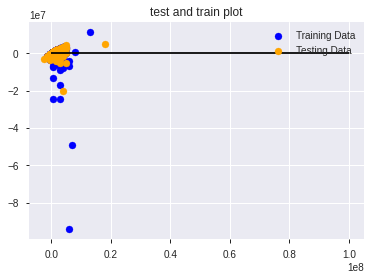

In [0]:
#plot the training data and test data
%matplotlib inline
import matplotlib.pyplot as plt
plt.scatter(lin_model.predict(X_train), lin_model.predict(X_train) - y_train, c="blue", label="Training Data")
plt.scatter(lin_model.predict(X_test), lin_model.predict(X_test) - y_test, c="orange", label="Testing Data")
plt.legend()
plt.hlines(y=0, xmin=y.min(), xmax=y.max())
plt.title("test and train plot")

In [0]:
## bed vs price analysis
X_building =singlefam_data_nocal.building_size.values.reshape(-1, 1)
y_building = singlefam_data_nocal.price.values.reshape(-1, 1)
X_train, X_test, y_train, y_test = train_test_split(X_building, y_building, random_state=100)

In [0]:
building_train_score = lin_model.score(X_train, y_train)
building_test_score = lin_model.score(X_test, y_test)
print(f"building_size training score: {building_train_score}")
print(f"building_size testing score: {building_test_score}")

In [0]:
plt.scatter(lin_model.predict(X_train), lin_model.predict(X_train) - y_train, c="blue", label="Training Data")
plt.scatter(lin_model.predict(X_test), lin_model.predict(X_test) - y_test, c="orange", label="Testing Data")
plt.legend()
plt.hlines(y=0, xmin=y.min(), xmax=y.max())
plt.title("test and train plot_ building size")

In [0]:
import numpy as np
bed_array = singlefam_data_nocal['beds'].to_numpy()
price_array = singlefam_data_nocal['price'].to_numpy()

In [0]:
print(bed_array)

In [0]:
from pycaret.classification import *
clf1 = setup(data = X_bed, target = y_bed)
# comparing all models
compare_models()